In [1]:
import pandas as pd
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet
from statsmodels.tools.eval_measures import rmse
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.serialize import model_to_json, model_from_json

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

df = pd.read_csv('D:\Download( Chrome)\ELEC0088_Assignment-main\LSTM/london_weather.csv')
# print(df.info())
df.dropna(inplace= True)
df.reset_index(drop=True, inplace=True)
# print(df.info())

In [2]:
# print(df.tail())
df = df.rename(columns={'mean_temp': 'y', 'date':'ds'})
# df = df[-2000:]
# df=df[["date","mean_temp","pressure"]]
# df.columns = ['ds','y',"pressure"]
df['ds'] = pd.to_datetime(df['ds'], format='%Y%m%d')
# print(df.tail())

In [3]:
df.sort_values(by='ds', inplace = True)
df.reset_index(drop=True, inplace=True)
# print(df.head())
# print(df.tail())

13843


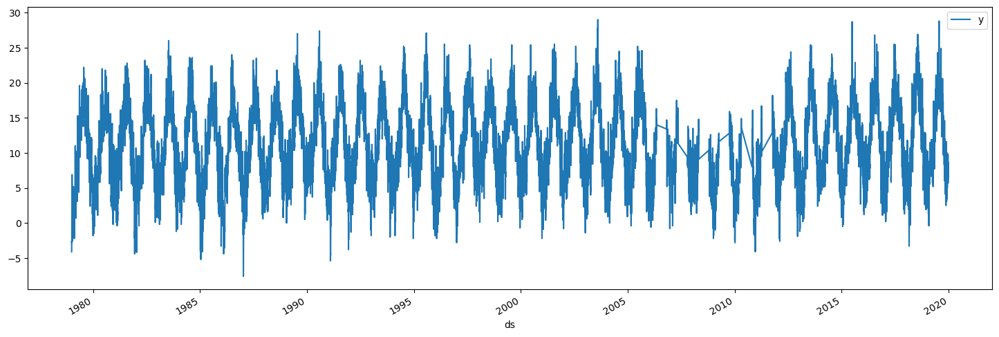

In [4]:
df.plot(x='ds',y='y',figsize=(18,6))
print(len(df))

In [5]:
Test_split = 365
train = df.iloc[:len(df)-Test_split]
test = df.iloc[len(df)-Test_split:]

print(len(train))
print(len(test))

print(df.tail())

13478
365
              ds  cloud_cover  sunshine  global_radiation  max_temp    y  \
13838 2019-12-27          8.0       0.0              12.0       9.6  7.5   
13839 2019-12-28          8.0       0.0              12.0       9.9  8.1   
13840 2019-12-29          6.0       2.2              29.0      11.5  8.7   
13841 2019-12-30          0.0       3.6              37.0       9.3  6.5   
13842 2019-12-31          7.0       0.0              13.0       9.4  7.1   

       min_temp  precipitation  pressure  snow_depth  
13838       6.6            0.0  102880.0         0.0  
13839       6.6            0.0  103630.0         0.0  
13840       7.4            0.0  103360.0         0.0  
13841       1.5            0.0  102970.0         0.0  
13842       4.9            0.0  103160.0         0.0  


In [6]:
def preprocessing (multi_var,periods):
    t = train[['ds',multi_var]]
    t = t.rename(columns={multi_var: 'y', 'date':'ds'})
    model = Prophet()
    model.fit(t)
    future = model.make_future_dataframe(periods=periods)
    forecast = model.predict(future)
    return forecast['yhat']

def cross_valid_check(train, df_p, periods):
    best_feature = None
    lowest = df_p.iloc[-1]['mape']
    for column in train.loc[:, ~train.columns.isin(['ds', 'y'])].columns:
        m_cross_valid = Prophet()
        m_cross_valid.add_regressor(column)
        m_cross_valid.fit(train)
        print('Cross validating model with dataset: '+ column)
        
        df_cv_cross_valid = cross_validation(m_cross_valid, initial='12000 days', period='180 days', horizon = '365 days')
        df_p_cross_valid = performance_metrics(df_cv_cross_valid)
        if df_p_cross_valid.iloc[-1]['mape'] < lowest:
            print(lowest ,df_p_cross_valid.iloc[-1]['mape'])
            lowest = df_p_cross_valid.iloc[-1]['mape']
            print(column+' is better')
            best_feature = column
    print('\n')
    return best_feature

02:19:03 - cmdstanpy - INFO - Chain [1] start processing
02:19:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/13 [00:00<?, ?it/s]

02:19:08 - cmdstanpy - INFO - Chain [1] start processing
02:19:11 - cmdstanpy - INFO - Chain [1] done processing
02:19:12 - cmdstanpy - INFO - Chain [1] start processing
02:19:14 - cmdstanpy - INFO - Chain [1] done processing
02:19:15 - cmdstanpy - INFO - Chain [1] start processing
02:19:18 - cmdstanpy - INFO - Chain [1] done processing
02:19:19 - cmdstanpy - INFO - Chain [1] start processing
02:19:22 - cmdstanpy - INFO - Chain [1] done processing
02:19:23 - cmdstanpy - INFO - Chain [1] start processing
02:19:25 - cmdstanpy - INFO - Chain [1] done processing
02:19:26 - cmdstanpy - INFO - Chain [1] start processing
02:19:29 - cmdstanpy - INFO - Chain [1] done processing
02:19:30 - cmdstanpy - INFO - Chain [1] start processing
02:19:34 - cmdstanpy - INFO - Chain [1] done processing
02:19:35 - cmdstanpy - INFO - Chain [1] start processing
02:19:39 - cmdstanpy - INFO - Chain [1] done processing
02:19:40 - cmdstanpy - INFO - Chain [1] start processing
02:19:43 - cmdstanpy - INFO - Chain [1]

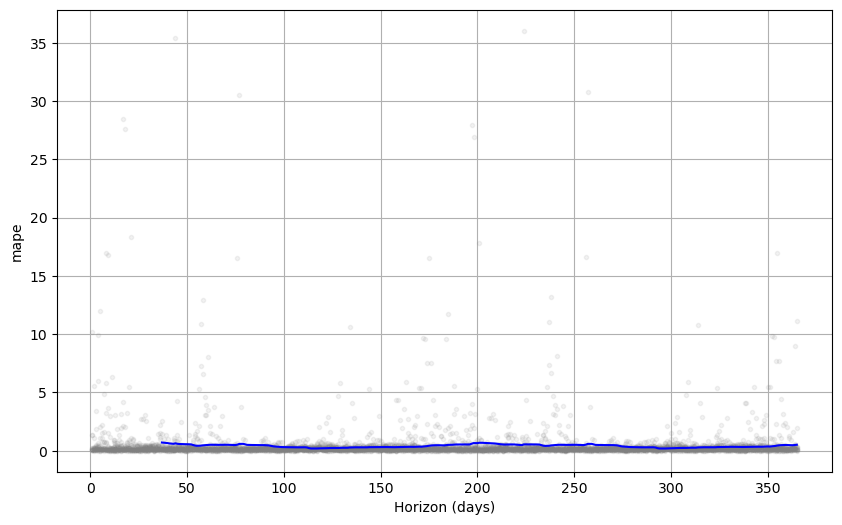

In [7]:
periods = 365*6
m = Prophet()
m.fit(train)
# future = m.make_future_dataframe(periods=periods)
# forecast = m.predict(future)
df_cv = cross_validation(m, initial='12000 days', period='180 days', horizon = '365 days')
df_p = performance_metrics(df_cv)
fig = plot_cross_validation_metric(df_cv, metric='mape')

In [8]:
m = Prophet()
best_feature = cross_valid_check(train, df_p, periods)
m.add_regressor(str(best_feature))
print(best_feature +' added to the model')
m.fit(train)
future = m.make_future_dataframe(periods=periods)
future[best_feature] = preprocessing(best_feature,periods)
print (best_feature+ ' predicted ')
forecast = m.predict(future)
print('Forecasting the temperature')

02:20:03 - cmdstanpy - INFO - Chain [1] start processing
02:20:07 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: cloud_cover


  0%|          | 0/13 [00:00<?, ?it/s]

02:20:08 - cmdstanpy - INFO - Chain [1] start processing
02:20:12 - cmdstanpy - INFO - Chain [1] done processing
02:20:13 - cmdstanpy - INFO - Chain [1] start processing
02:20:16 - cmdstanpy - INFO - Chain [1] done processing
02:20:17 - cmdstanpy - INFO - Chain [1] start processing
02:20:20 - cmdstanpy - INFO - Chain [1] done processing
02:20:21 - cmdstanpy - INFO - Chain [1] start processing
02:20:24 - cmdstanpy - INFO - Chain [1] done processing
02:20:25 - cmdstanpy - INFO - Chain [1] start processing
02:20:28 - cmdstanpy - INFO - Chain [1] done processing
02:20:29 - cmdstanpy - INFO - Chain [1] start processing
02:20:33 - cmdstanpy - INFO - Chain [1] done processing
02:20:34 - cmdstanpy - INFO - Chain [1] start processing
02:20:39 - cmdstanpy - INFO - Chain [1] done processing
02:20:40 - cmdstanpy - INFO - Chain [1] start processing
02:20:44 - cmdstanpy - INFO - Chain [1] done processing
02:20:45 - cmdstanpy - INFO - Chain [1] start processing
02:20:49 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: sunshine


  0%|          | 0/13 [00:00<?, ?it/s]

02:21:17 - cmdstanpy - INFO - Chain [1] start processing
02:21:20 - cmdstanpy - INFO - Chain [1] done processing
02:21:21 - cmdstanpy - INFO - Chain [1] start processing
02:21:25 - cmdstanpy - INFO - Chain [1] done processing
02:21:26 - cmdstanpy - INFO - Chain [1] start processing
02:21:28 - cmdstanpy - INFO - Chain [1] done processing
02:21:30 - cmdstanpy - INFO - Chain [1] start processing
02:21:34 - cmdstanpy - INFO - Chain [1] done processing
02:21:35 - cmdstanpy - INFO - Chain [1] start processing
02:21:38 - cmdstanpy - INFO - Chain [1] done processing
02:21:40 - cmdstanpy - INFO - Chain [1] start processing
02:21:43 - cmdstanpy - INFO - Chain [1] done processing
02:21:44 - cmdstanpy - INFO - Chain [1] start processing
02:21:47 - cmdstanpy - INFO - Chain [1] done processing
02:21:48 - cmdstanpy - INFO - Chain [1] start processing
02:21:52 - cmdstanpy - INFO - Chain [1] done processing
02:21:53 - cmdstanpy - INFO - Chain [1] start processing
02:21:57 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: global_radiation


  0%|          | 0/13 [00:00<?, ?it/s]

02:22:23 - cmdstanpy - INFO - Chain [1] start processing
02:22:26 - cmdstanpy - INFO - Chain [1] done processing
02:22:27 - cmdstanpy - INFO - Chain [1] start processing
02:22:30 - cmdstanpy - INFO - Chain [1] done processing
02:22:31 - cmdstanpy - INFO - Chain [1] start processing
02:22:34 - cmdstanpy - INFO - Chain [1] done processing
02:22:35 - cmdstanpy - INFO - Chain [1] start processing
02:22:39 - cmdstanpy - INFO - Chain [1] done processing
02:22:40 - cmdstanpy - INFO - Chain [1] start processing
02:22:45 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:49 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:56 - cmdstanpy - INFO - Chain [1] start processing
02:23:00 - cmdstanpy - INFO - Chain [1] done processing
02:23:01 - cmdstanpy - INFO - Chain [1] start processing
02:23:04 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: max_temp


  0%|          | 0/13 [00:00<?, ?it/s]

02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:41 - cmdstanpy - INFO - Chain [1] done processing
02:23:42 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:52 - cmdstanpy - INFO - Chain [1] start processing
02:23:55 - cmdstanpy - INFO - Chain [1] done processing
02:23:56 - cmdstanpy - INFO - Chain [1] start processing
02:23:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:00 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:07 - cmdstanpy - INFO - Chain [1]

0.5129732099734509 0.32101725133479003
max_temp is better


02:24:31 - cmdstanpy - INFO - Chain [1] start processing
02:24:37 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: min_temp


  0%|          | 0/13 [00:00<?, ?it/s]

02:24:38 - cmdstanpy - INFO - Chain [1] start processing
02:24:43 - cmdstanpy - INFO - Chain [1] done processing
02:24:44 - cmdstanpy - INFO - Chain [1] start processing
02:24:49 - cmdstanpy - INFO - Chain [1] done processing
02:24:50 - cmdstanpy - INFO - Chain [1] start processing
02:24:55 - cmdstanpy - INFO - Chain [1] done processing
02:24:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:02 - cmdstanpy - INFO - Chain [1] done processing
02:25:03 - cmdstanpy - INFO - Chain [1] start processing
02:25:07 - cmdstanpy - INFO - Chain [1] done processing
02:25:08 - cmdstanpy - INFO - Chain [1] start processing
02:25:13 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:19 - cmdstanpy - INFO - Chain [1] done processing
02:25:20 - cmdstanpy - INFO - Chain [1] start processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:26 - cmdstanpy - INFO - Chain [1] start processing
02:25:31 - cmdstanpy - INFO - Chain [1]

0.32101725133479003 0.19187897134214232
min_temp is better


02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:08 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: precipitation


  0%|          | 0/13 [00:00<?, ?it/s]

02:26:10 - cmdstanpy - INFO - Chain [1] start processing
02:26:12 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:16 - cmdstanpy - INFO - Chain [1] done processing
02:26:18 - cmdstanpy - INFO - Chain [1] start processing
02:26:20 - cmdstanpy - INFO - Chain [1] done processing
02:26:21 - cmdstanpy - INFO - Chain [1] start processing
02:26:25 - cmdstanpy - INFO - Chain [1] done processing
02:26:26 - cmdstanpy - INFO - Chain [1] start processing
02:26:29 - cmdstanpy - INFO - Chain [1] done processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:33 - cmdstanpy - INFO - Chain [1] done processing
02:26:35 - cmdstanpy - INFO - Chain [1] start processing
02:26:38 - cmdstanpy - INFO - Chain [1] done processing
02:26:39 - cmdstanpy - INFO - Chain [1] start processing
02:26:44 - cmdstanpy - INFO - Chain [1] done processing
02:26:45 - cmdstanpy - INFO - Chain [1] start processing
02:26:48 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: pressure


  0%|          | 0/13 [00:00<?, ?it/s]

02:27:14 - cmdstanpy - INFO - Chain [1] start processing
02:27:17 - cmdstanpy - INFO - Chain [1] done processing
02:27:18 - cmdstanpy - INFO - Chain [1] start processing
02:27:20 - cmdstanpy - INFO - Chain [1] done processing
02:27:22 - cmdstanpy - INFO - Chain [1] start processing
02:27:25 - cmdstanpy - INFO - Chain [1] done processing
02:27:26 - cmdstanpy - INFO - Chain [1] start processing
02:27:30 - cmdstanpy - INFO - Chain [1] done processing
02:27:31 - cmdstanpy - INFO - Chain [1] start processing
02:27:35 - cmdstanpy - INFO - Chain [1] done processing
02:27:36 - cmdstanpy - INFO - Chain [1] start processing
02:27:40 - cmdstanpy - INFO - Chain [1] done processing
02:27:41 - cmdstanpy - INFO - Chain [1] start processing
02:27:45 - cmdstanpy - INFO - Chain [1] done processing
02:27:46 - cmdstanpy - INFO - Chain [1] start processing
02:27:51 - cmdstanpy - INFO - Chain [1] done processing
02:27:52 - cmdstanpy - INFO - Chain [1] start processing
02:27:56 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: snow_depth


  0%|          | 0/13 [00:00<?, ?it/s]

02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1] done processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:28 - cmdstanpy - INFO - Chain [1] done processing
02:28:29 - cmdstanpy - INFO - Chain [1] start processing
02:28:32 - cmdstanpy - INFO - Chain [1] done processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:37 - cmdstanpy - INFO - Chain [1] done processing
02:28:38 - cmdstanpy - INFO - Chain [1] start processing
02:28:41 - cmdstanpy - INFO - Chain [1] done processing
02:28:43 - cmdstanpy - INFO - Chain [1] start processing
02:28:45 - cmdstanpy - INFO - Chain [1] done processing
02:28:47 - cmdstanpy - INFO - Chain [1] start processing
02:28:50 - cmdstanpy - INFO - Chain [1] done processing
02:28:52 - cmdstanpy - INFO - Chain [1] start processing
02:28:56 - cmdstanpy - INFO - Chain [1] done processing
02:28:57 - cmdstanpy - INFO - Chain [1] start processing
02:29:01 - cmdstanpy - INFO - Chain [1]



min_temp added to the model


02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:30 - cmdstanpy - INFO - Chain [1] done processing


min_temp predicted 
Forecasting the temperature


In [9]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
15663,2024-12-25,7.462199,5.829171,9.288419
15664,2024-12-26,7.431437,5.647156,9.260351
15665,2024-12-27,7.359643,5.542361,9.222285
15666,2024-12-28,7.269745,5.409061,9.273563
15667,2024-12-29,7.278282,5.575293,9.125015


In [10]:
plot_plotly(m ,forecast)

In [11]:
plot_components_plotly(m, forecast)

In [12]:
predictions = forecast.iloc[len(train):len(train)+len(test)]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(predictions,test['y']))
print("Mean Value of Test Dataset:", test['y'].mean())

Root Mean Squared Error between actual and  predicted values:  2.5833097983552844
Mean Value of Test Dataset: 12.193972602739736


In [13]:
training = forecast.iloc[:len(train)]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(training,train['y']))

Root Mean Squared Error between actual and  predicted values:  2.868945104173282


In [14]:
# with open('model_multi_prophet_weather_cross_validation_model.json', 'w') as fout:
#     fout.write(model_to_json(m))

In [15]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].to_csv('Prophet weather forecast.csv')